In [25]:
import numpy as np
import cv2 as cv
import glob
import matplotlib.pyplot as plt

In [26]:
# termination criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((8*6,3), np.float32)
objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

images = glob.glob('/Users/goal0312/Desktop/thesis/3_calibration/cam3/*.png')

In [16]:
import cv2
img = cv2.imread(images[1])
img.shape[:2]

(1080, 1920)

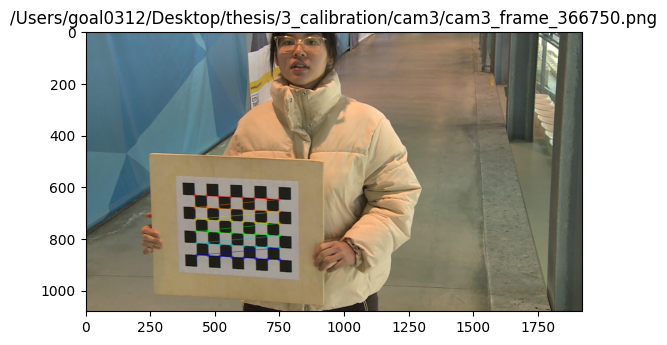

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366750.png Corners found: True


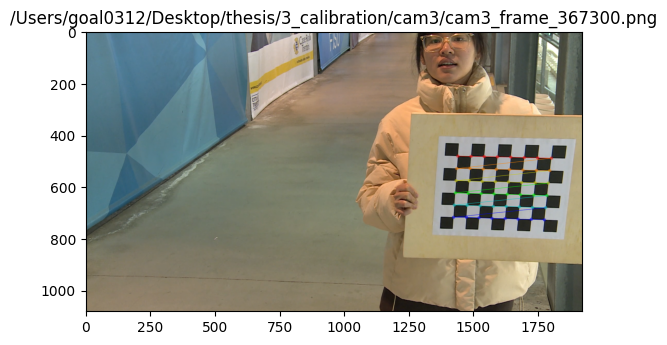

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367300.png Corners found: True


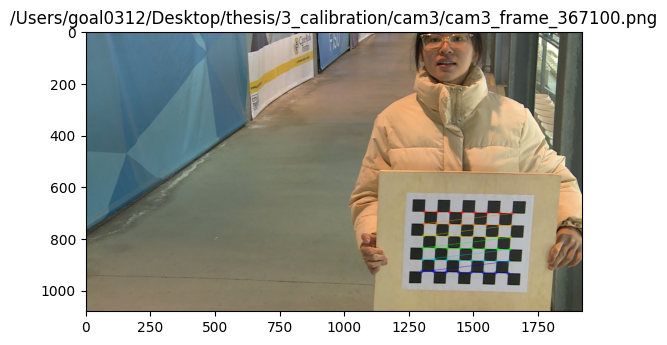

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367100.png Corners found: True


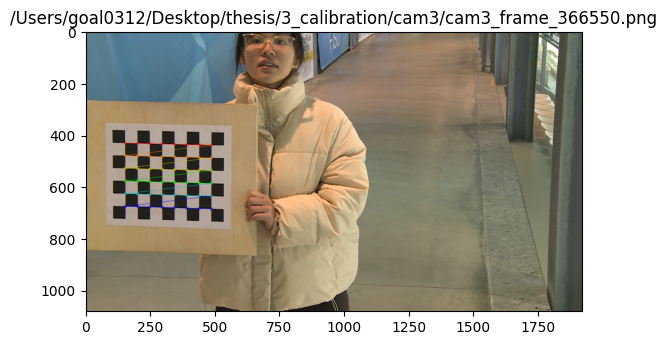

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366550.png Corners found: True


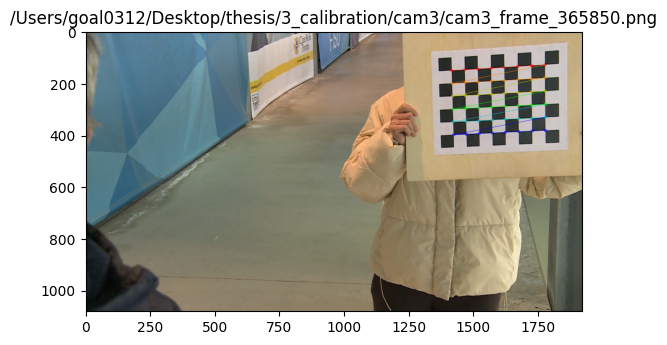

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_365850.png Corners found: True


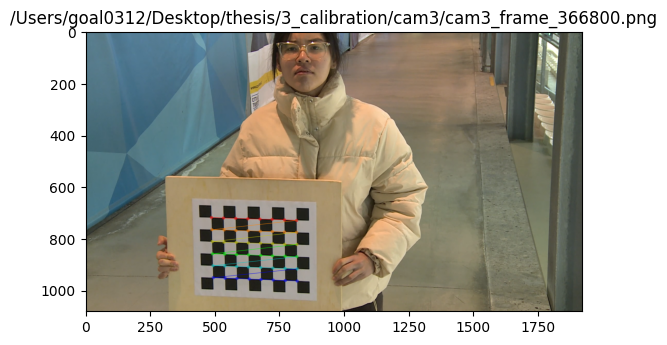

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366800.png Corners found: True


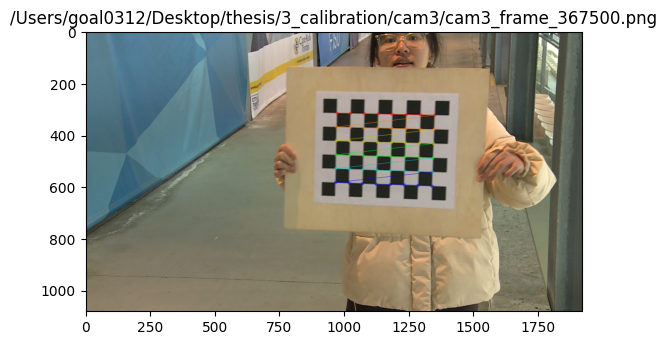

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367500.png Corners found: True


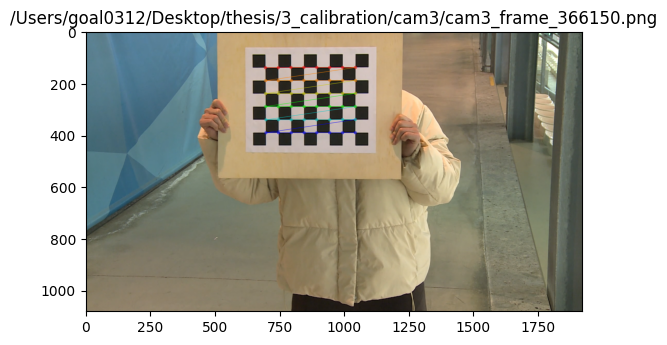

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366150.png Corners found: True


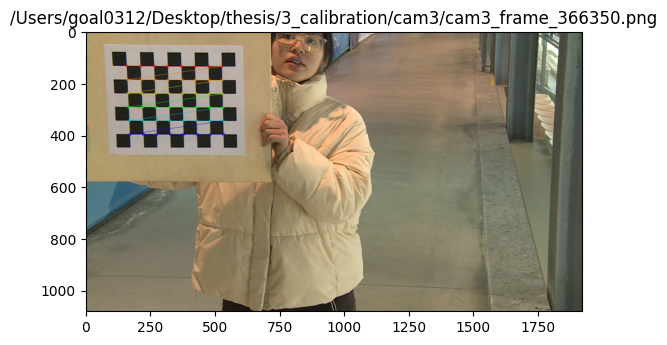

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366350.png Corners found: True


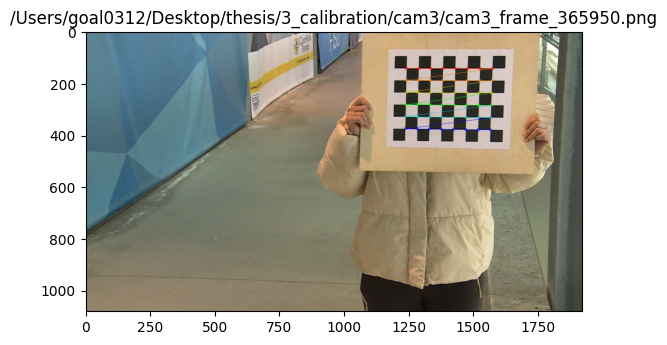

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_365950.png Corners found: True


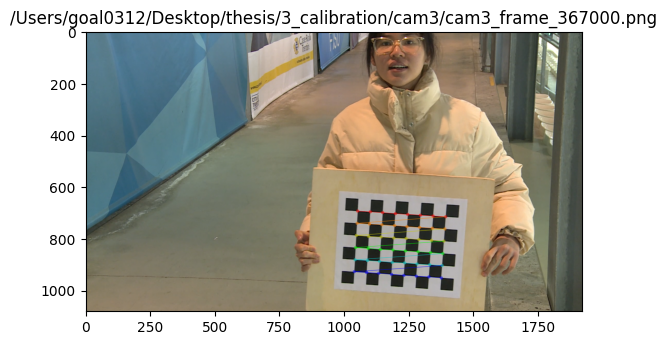

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367000.png Corners found: True


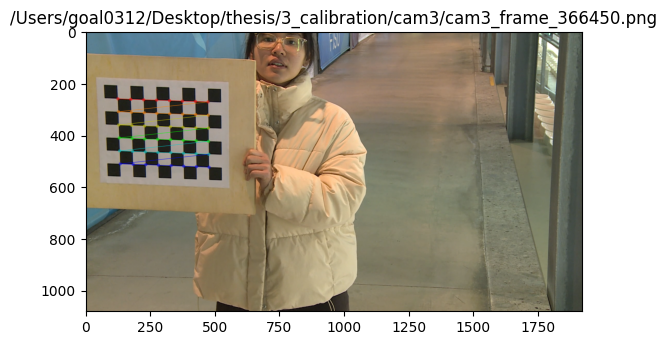

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366450.png Corners found: True


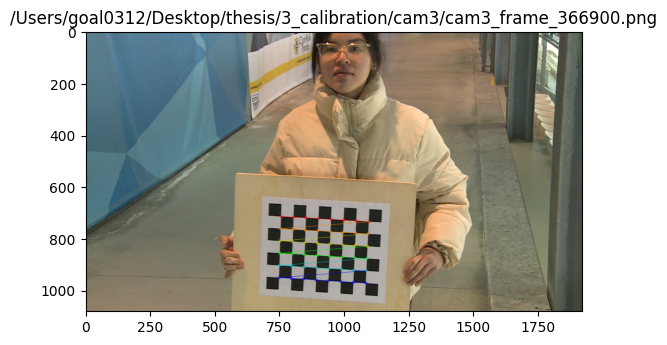

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366900.png Corners found: True


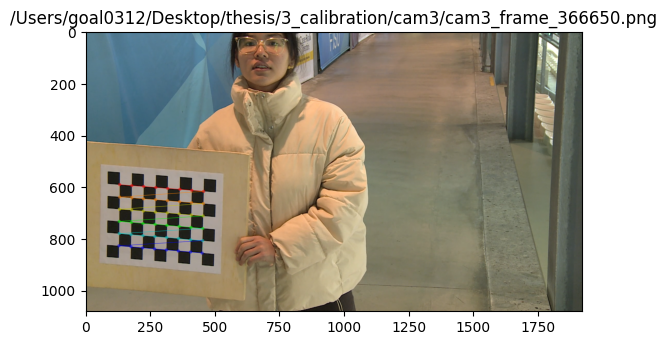

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366650.png Corners found: True


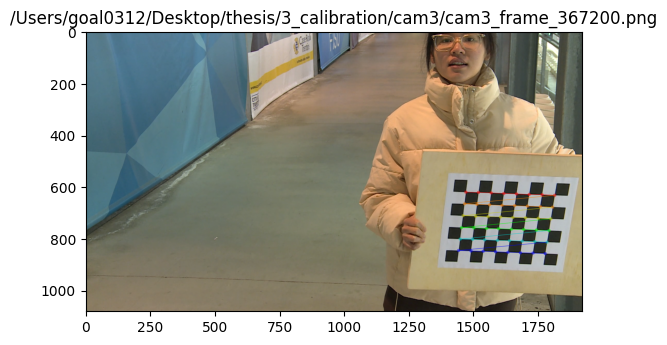

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367200.png Corners found: True


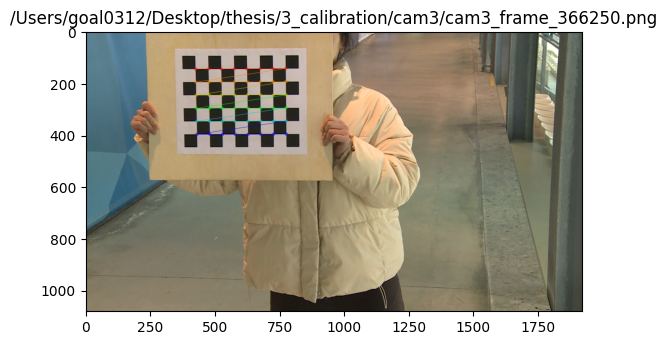

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366250.png Corners found: True


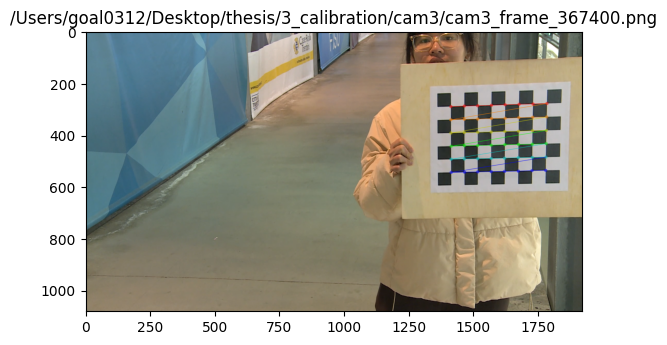

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367400.png Corners found: True


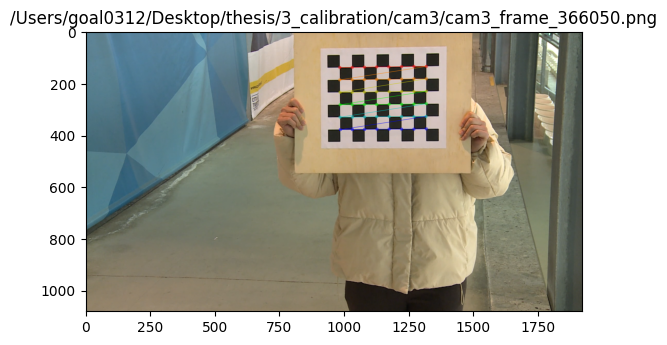

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366050.png Corners found: True


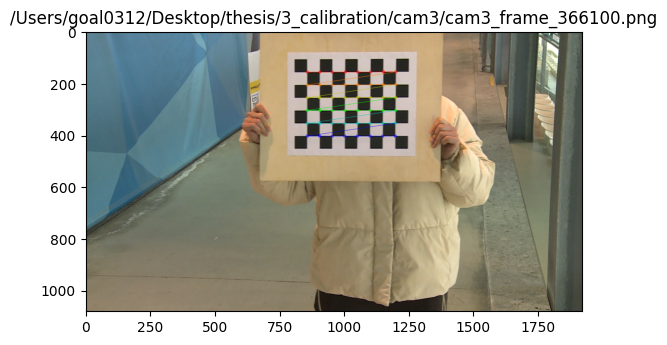

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366100.png Corners found: True


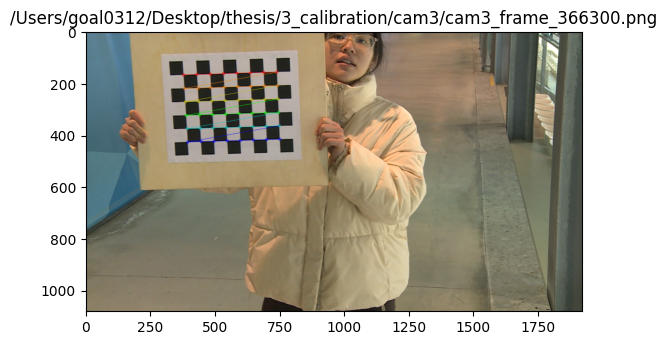

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366300.png Corners found: True


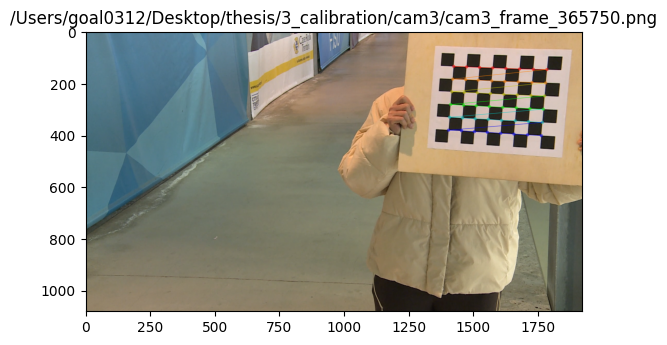

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_365750.png Corners found: True


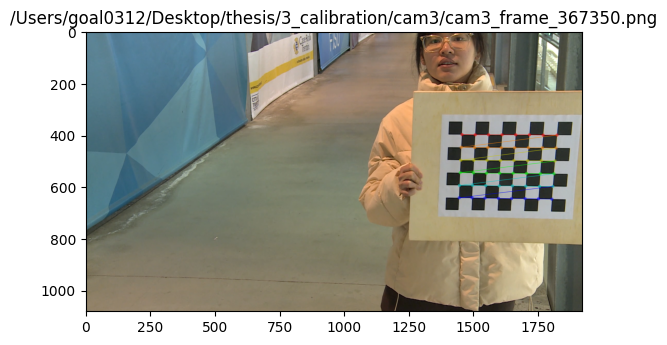

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367350.png Corners found: True


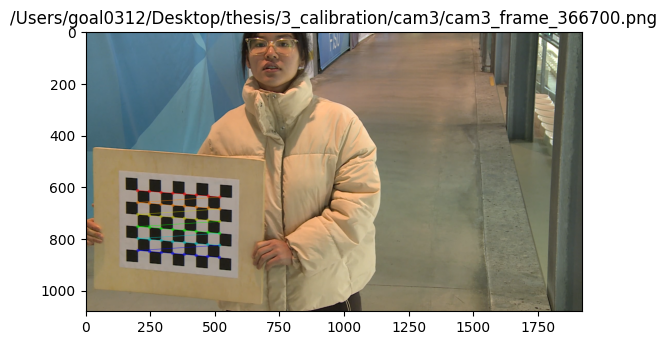

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366700.png Corners found: True


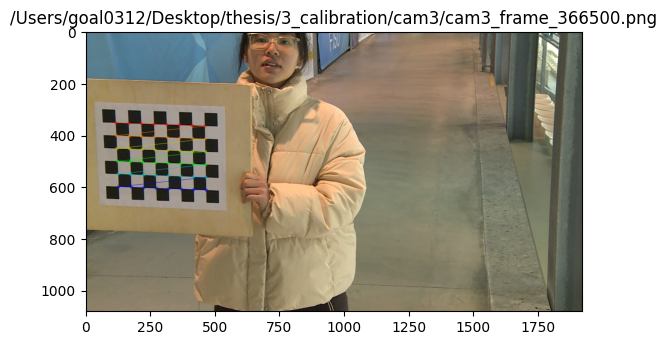

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366500.png Corners found: True


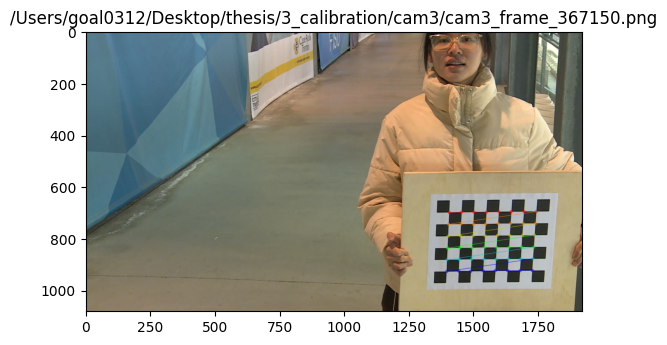

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367150.png Corners found: True


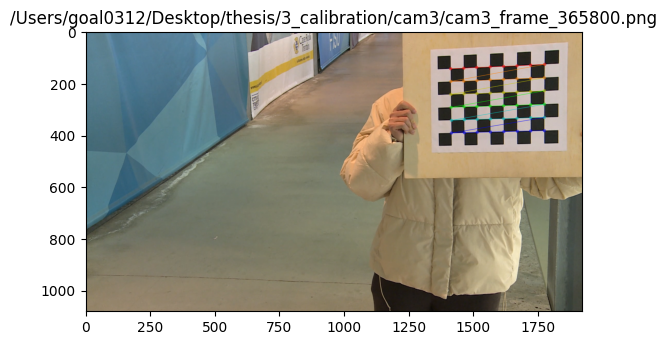

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_365800.png Corners found: True


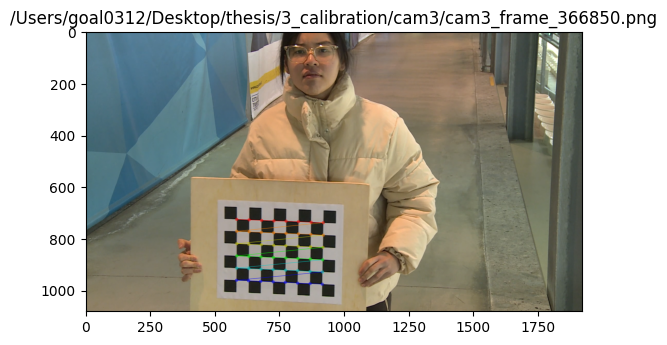

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366850.png Corners found: True


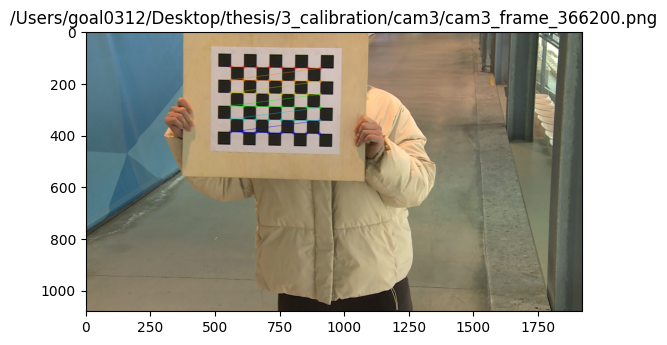

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366200.png Corners found: True


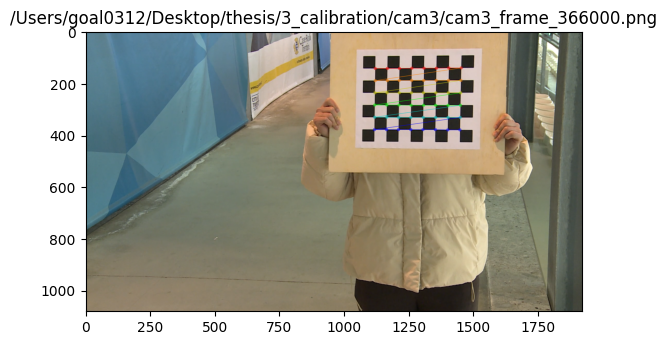

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366000.png Corners found: True


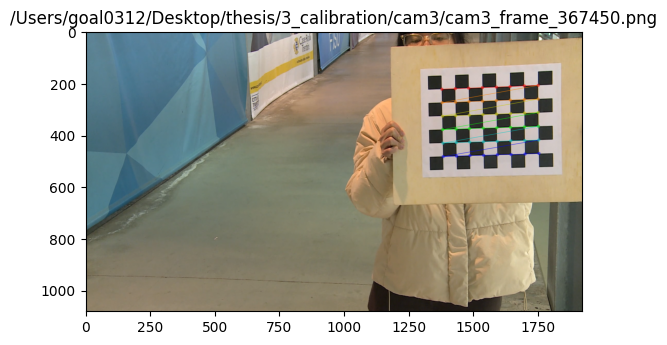

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367450.png Corners found: True


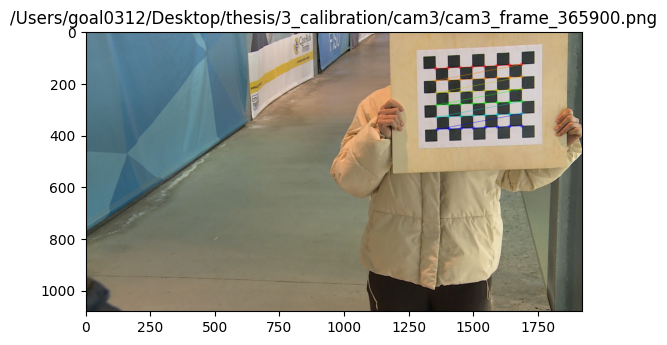

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_365900.png Corners found: True


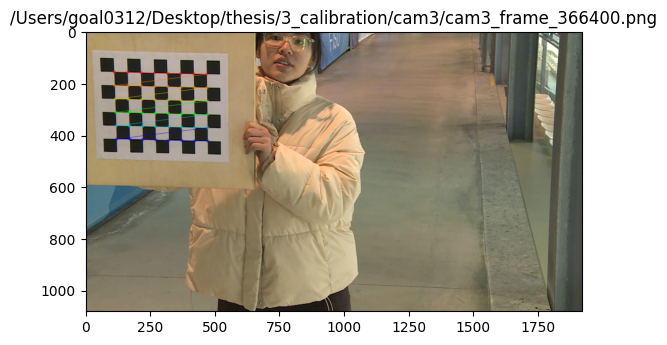

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366400.png Corners found: True


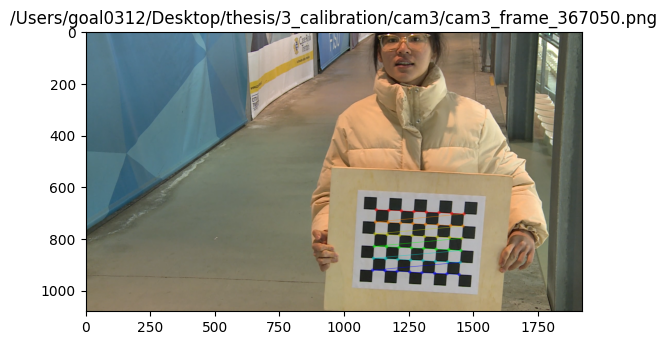

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367050.png Corners found: True


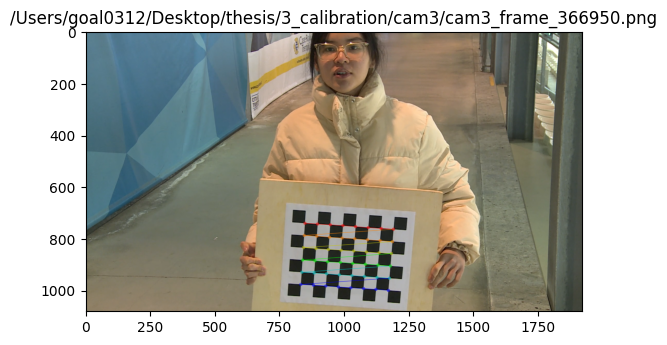

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366950.png Corners found: True


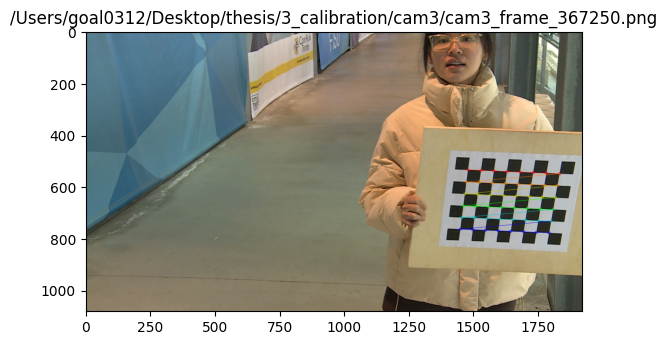

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_367250.png Corners found: True


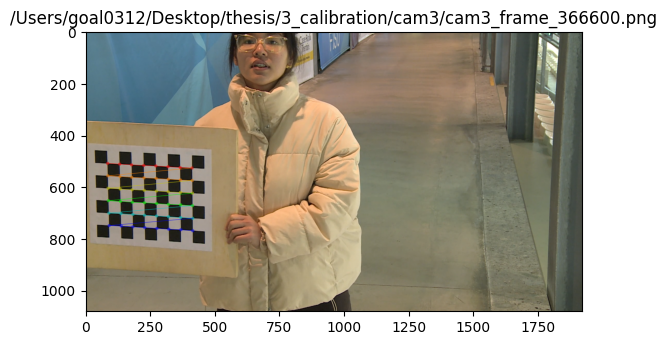

/Users/goal0312/Desktop/thesis/3_calibration/cam3/cam3_frame_366600.png Corners found: True


In [27]:
for fname in images:
    img = cv.imread(fname)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv.findChessboardCorners(gray, (8,6), None)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        cv.drawChessboardCorners(img, (8,6), corners2, ret)
        plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        plt.title(fname)
        plt.show()
        print(fname, "Corners found:", ret)

cv.destroyAllWindows()

In [28]:
ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
print("RMS re-projection error:", ret)
print("Camera matrix:\n", mtx)
print("Distortion coefficients:\n", dist)

RMS re-projection error: 0.3061011948242539
Camera matrix:
 [[3.66103164e+03 0.00000000e+00 9.28913019e+02]
 [0.00000000e+00 3.68958497e+03 6.24886883e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Distortion coefficients:
 [[2.39328104e-01 7.46320042e-01 1.44937365e-02 1.83144030e-03
  6.18924936e+00]]


In [12]:
np.array(tvecs).shape

(18, 3, 1)

In [11]:
mean_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv.norm(imgpoints[i], imgpoints2, cv.NORM_L2) / len(imgpoints2)
    print(i, error)

0 0.04952010891857225
1 0.05223338084646741
2 0.05251980544571468
3 0.05240734666346014
4 0.05861395077373569
5 0.10770202209723169
6 0.05153526284440745
7 0.05187545871575574
8 0.05401396823568097
9 0.049562162438202655
10 0.05257989598665275
11 0.05157500194995685
12 0.04875416035757657
13 0.05559127720884279
14 0.05863227764142017
15 0.05413324160144306
16 0.052461710024812334
17 0.04759861033433513
18 0.05429541144496564
19 0.049954777119608024
20 0.04649764967326069
21 0.0558976987391251
22 0.04952010891857225
23 0.05223338084646741
24 0.05251980544571468
25 0.05240734666346014
26 0.05861395077373569
27 0.10770202209723169
28 0.05153526284440745
29 0.05187545871575574
30 0.05401396823568097
31 0.049562162438202655
32 0.05257989598665275
33 0.05157500194995685
34 0.04875416035757657
35 0.05559127720884279
36 0.05863227764142017
37 0.05413324160144306
38 0.052461710024812334
39 0.04759861033433513
40 0.05429541144496564
41 0.049954777119608024
42 0.04649764967326069
43 0.05589769873

In [ ]:
so I have multiple camera. and I thought I was supposed to calibrate each camera separately doing intrinsic with chessboard, extrinsic with landmark location and solvePnP for each camera?